In [1]:
# %load utils/imports.py
%matplotlib inline
import numpy as np
import pandas as pd
from utils import *
#from utils.styles import *

# %load utils/plotting.py
import seaborn as sns
from plotly.offline import init_notebook_mode, iplot
import cufflinks as cf

init_notebook_mode()
cf.go_offline()
import re

In [78]:
df = pd.read_csv('data/LAX_new.csv') # flight data
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 188159 entries, 0 to 188158
Data columns (total 24 columns):
YEAR                188159 non-null int64
MONTH               188159 non-null int64
DAY_OF_WEEK         188159 non-null int64
FL_DATE             188159 non-null int64
UNIQUE_CARRIER      188159 non-null object
ORIGIN              188159 non-null object
DEST                188159 non-null object
DEP_TIME            188159 non-null int64
ARR_TIME            188159 non-null int64
ARR_DELAY_Y         188159 non-null int64
ARR_DELAY           188159 non-null int64
ARR_DELAY_NEW       188159 non-null int64
ARR_DEL15           188159 non-null int64
DISTANCE            188159 non-null int64
ORIGIN_Latitude     188159 non-null float64
ORIGIN_Longitude    188159 non-null float64
ORIGIN_Data_2014    188159 non-null int64
weekend             188159 non-null int64
fed_hol             188159 non-null int64
a_hol               188159 non-null int64
l_hol               188159 non-null int64


In [3]:
df.describe()

,YEAR,MONTH,DAY_OF_WEEK,FL_DATE,DEP_TIME,ARR_TIME,ARR_DELAY_Y,ARR_DELAY,ARR_DELAY_NEW,ARR_DEL15,DISTANCE,ORIGIN_Latitude,ORIGIN_Longitude,ORIGIN_Data_2014,weekend,fed_hol,a_hol,l_hol
count,188159.0,188159.000000,188159.000000,188159.000000,188159.000000,188159.000000,188159.000000,188159.000000,188159.000000,188159.000000,188159.000000,188159.000000,188159.000000,1.881590e+05,188159.000000,188159.000000,188159.000000,188159.000000
mean,2015.0,6.599913,3.939641,42189.222875,1378.036591,1491.287571,0.414155,5.213495,13.169766,0.218443,1311.316828,36.845558,-102.700394,1.699635e+07,0.264101,0.036288,0.297073,0.085927
std,0.0,3.376996,1.989788,103.195662,504.083273,549.172020,0.492577,40.755575,36.687707,0.413191,853.502998,5.984189,21.521847,1.038638e+07,0.440855,0.187007,0.456970,0.280257
min,2015.0,1.000000,1.000000,42005.000000,1.000000,1.000000,0.000000,-81.000000,0.000000,0.000000,109.000000,20.898650,-157.922428,2.020354e+06,0.000000,0.000000,0.000000,0.000000
25%,2015.0,4.000000,2.000000,42102.000000,919.000000,1048.000000,0.000000,-14.000000,0.000000,0.000000,370.000000,33.434278,-121.929022,7.878760e+06,0.000000,0.000000,0.000000,0.000000
50%,2015.0,7.000000,4.000000,42191.000000,1412.000000,1520.000000,0.000000,-3.000000,0.000000,0.000000,1242.000000,37.618972,-98.469778,1.768083e+07,0.000000,0.000000,0.000000,0.000000
75%,2015.0,9.000000,6.000000,42277.000000,1821.000000,1957.000000,1.000000,11.000000,11.000000,0.000000,2218.000000,40.639751,-84.428067,2.275601e+07,1.000000,0.000000,1.000000,0.000000
max,2015.0,12.000000,7.000000,42369.000000,2400.000000,2400.000000,1.000000,1636.000000,1636.000000,1.000000,2611.000000,61.174361,-71.005181,4.660427e+07,1.000000,1.000000,1.000000,1.000000


In [79]:
# Transform the time and break them down into hours
def time_convert(t):
    time = int(t/100)
    if t%100 >= 30:
        time += 1
    else:
        time = time
    if time == 24:
        time = 0
    elif time > 24:
        print 'Error! cannot over 24'
    return time
    
df['dt_g'] = df.DEP_TIME.apply(time_convert)
df['at_g'] = df.ARR_TIME.apply(time_convert)

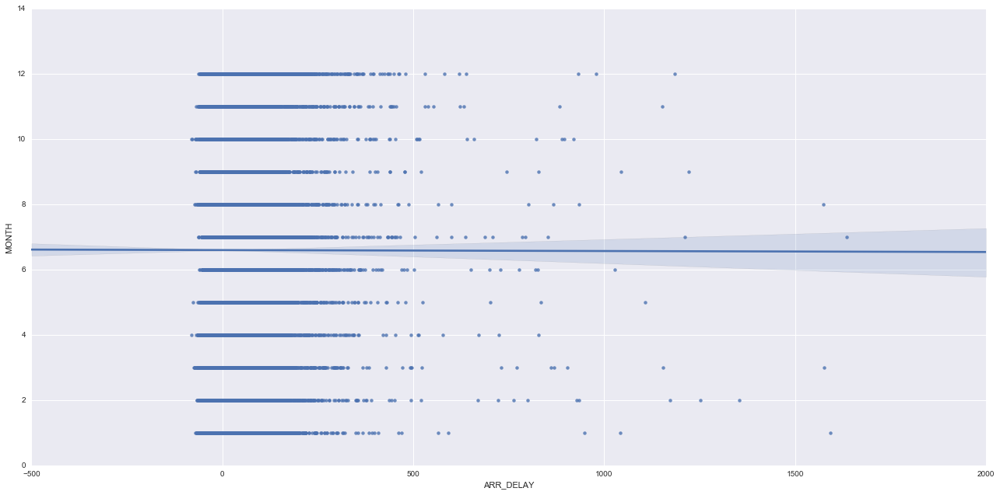

In [6]:
sns.lmplot("ARR_DELAY", "MONTH", df, size=9, aspect=2)

In [80]:
# Transform the month into 4 seasons
def month_code(m):
    month = int(m)
    if month >= 3 and month <= 5:
        month= 'Spring'
    elif month >= 6 and month <= 8:
        month = 'Summer'
    elif month >= 9 and month <= 11:
        month = 'Autumn'
    else:
        month = 'Winter'
    return month
    
df['month_coded'] = df.MONTH.apply(month_code)

In [24]:
df.iplot(kind='scatter', mode='markers', x='month_coded', y='ARR_DELAY')

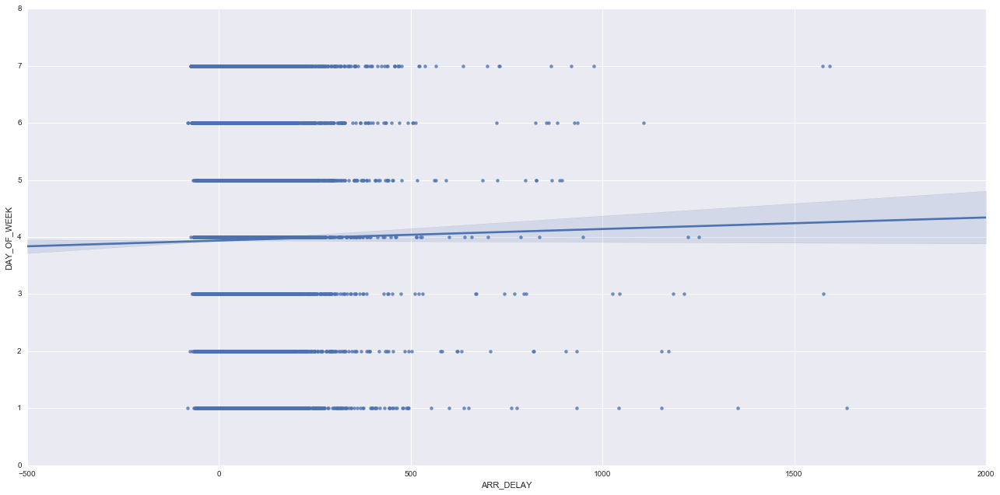

In [81]:
sns.lmplot("ARR_DELAY", "DAY_OF_WEEK", df, size=9, aspect=2)

In [82]:
# Transform the month into 4 seasons
def day_code(d):
    day = int(d)
    if day == 1:
        day = 'Monday'
    elif day == 7:
        day = 'Sunday'
    elif day == 6:
        day = 'Saturday'
    else:
        day = 'Other Weekdays'
    return day
    
df['day_coded'] = df.DAY_OF_WEEK.apply(day_code)

In [27]:
df.iplot(kind='scatter', mode='markers', x='day_coded', y='ARR_DELAY')

In [12]:
df.iplot(kind='scatter', mode='markers', x='UNIQUE_CARRIER', y='ARR_DELAY')

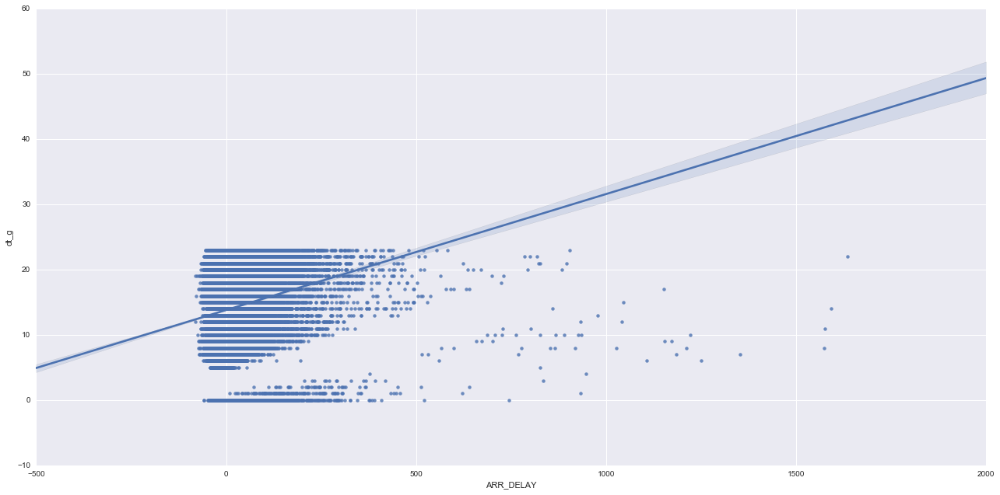

In [9]:
sns.lmplot("ARR_DELAY", "dt_g", df, size=9, aspect=2)

In [83]:
# Transform the DEP_TIMe into 3 groups
def dep_time_code(t):
    time = int(t)
    if time >= 5 and time <= 11:
        time = 'Morning Departure'
    elif time >= 12 and time <= 18:
        time = 'Afternoon Departure'
    else:
        time = 'Evening and Night Departure'
    return time
    
df['dt_g_code'] = df.dt_g.apply(dep_time_code)

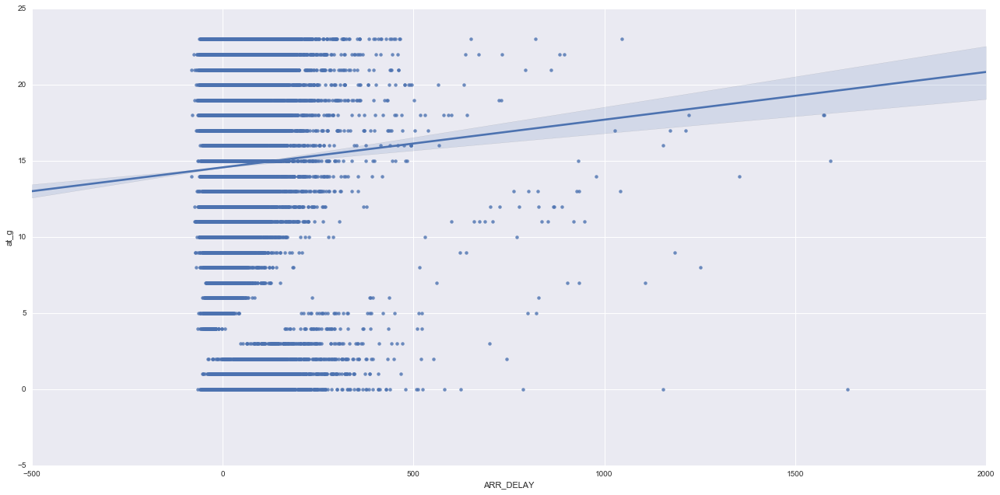

In [10]:
sns.lmplot("ARR_DELAY", "at_g", df, size=9, aspect=2)

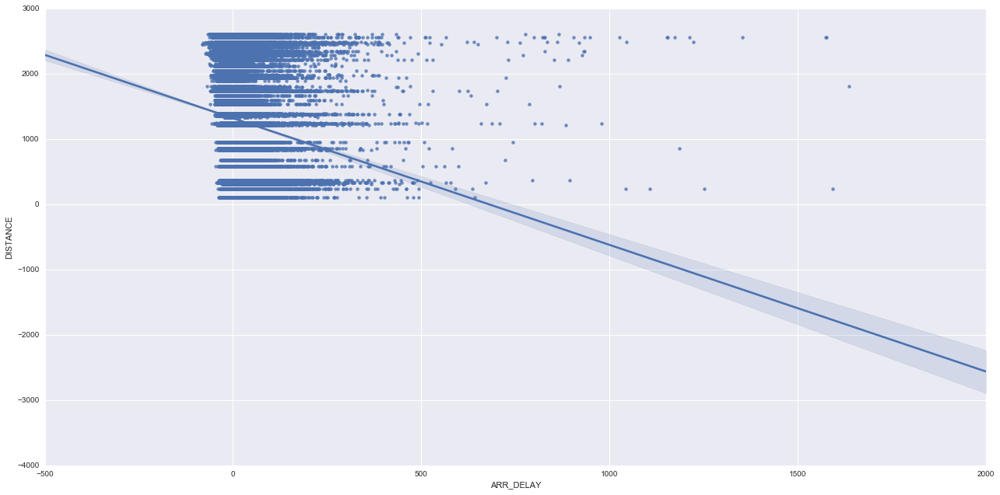

In [14]:
sns.lmplot("ARR_DELAY", "DISTANCE", df, size=9, aspect=2)

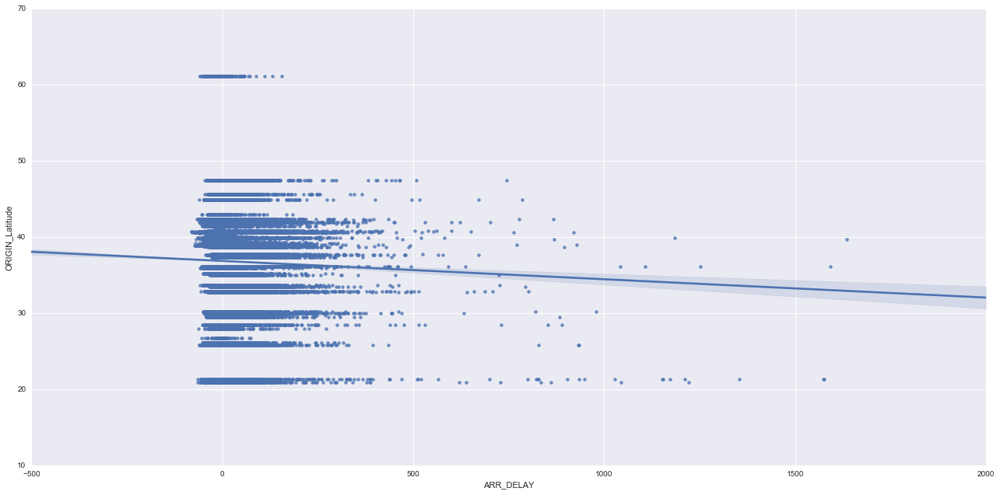

In [15]:
sns.lmplot("ARR_DELAY", "ORIGIN_Latitude", df, size=9, aspect=2)
# no obvious use for origin latitude

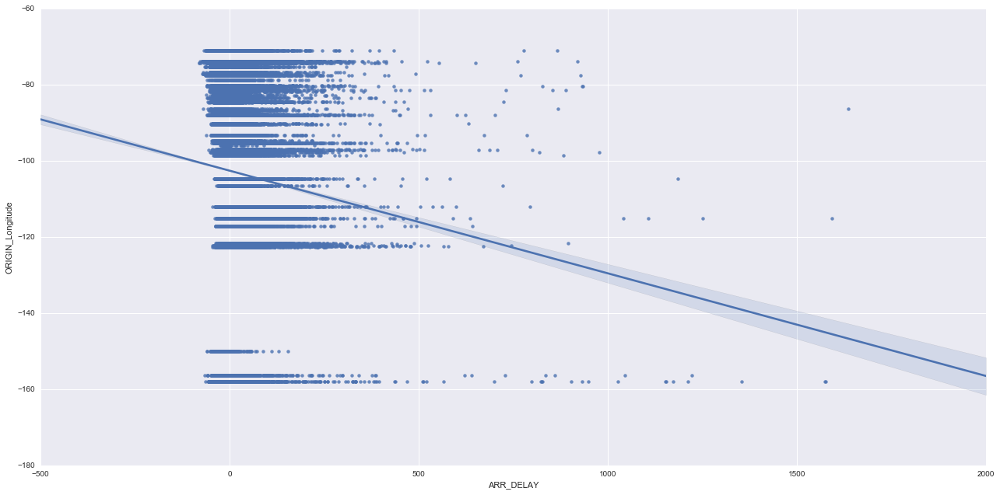

In [16]:
sns.lmplot("ARR_DELAY", "ORIGIN_Longitude", df, size=9, aspect=2)
# only slightly useful for the longitude - more inclined to be delay on more negative latitude

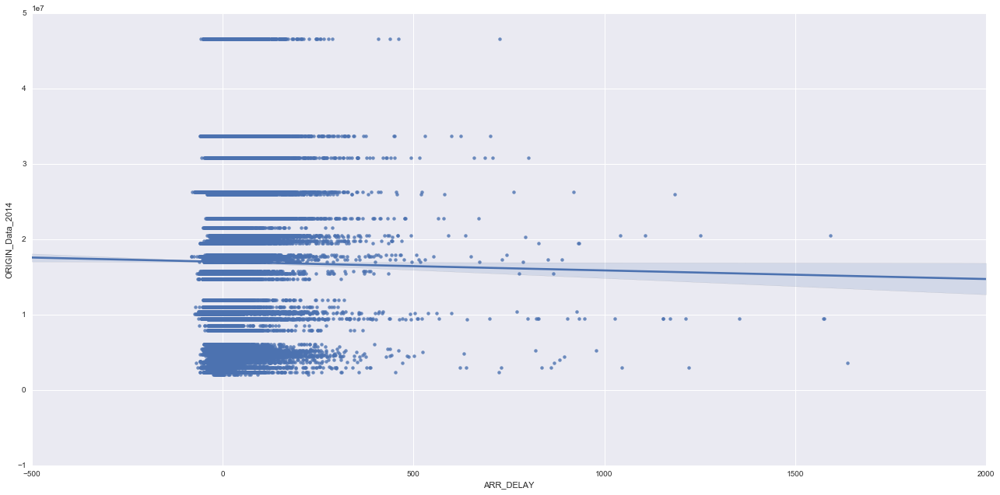

In [17]:
sns.lmplot("ARR_DELAY", "ORIGIN_Data_2014", df, size=9, aspect=2)

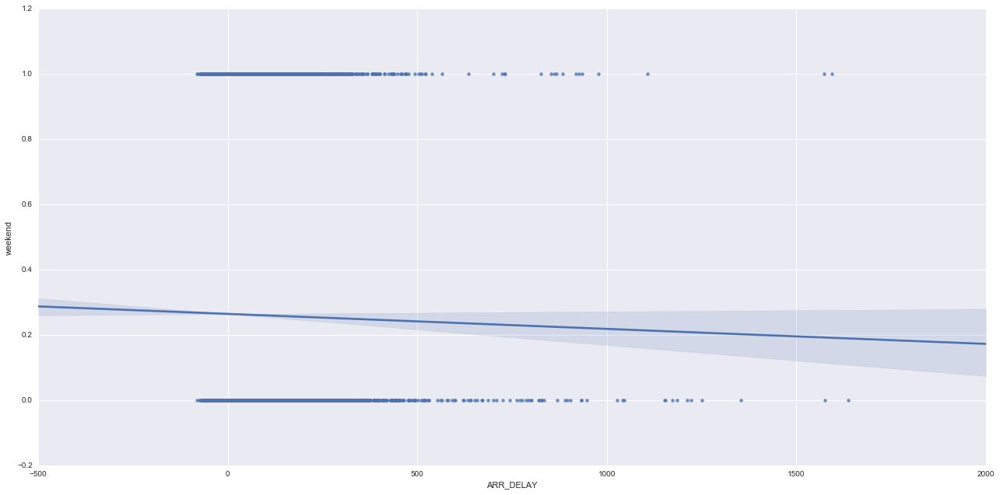

In [18]:
sns.lmplot("ARR_DELAY", "weekend", df, size=9, aspect=2)

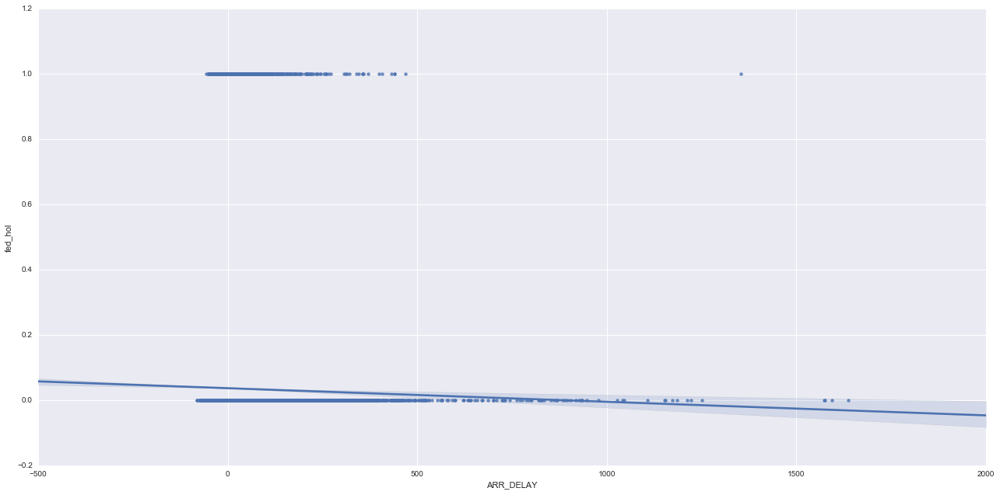

In [19]:
sns.lmplot("ARR_DELAY", "fed_hol", df, size=9, aspect=2)

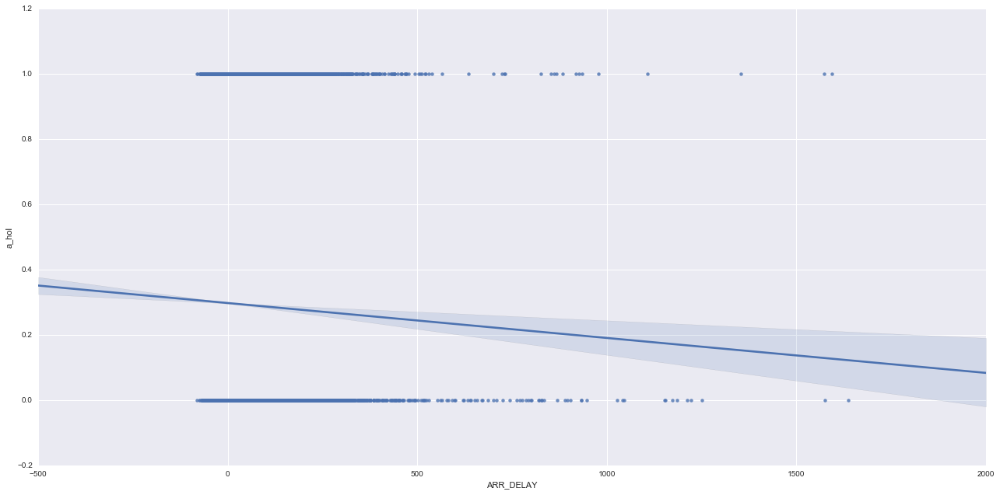

In [20]:
sns.lmplot("ARR_DELAY", "a_hol", df, size=9, aspect=2)

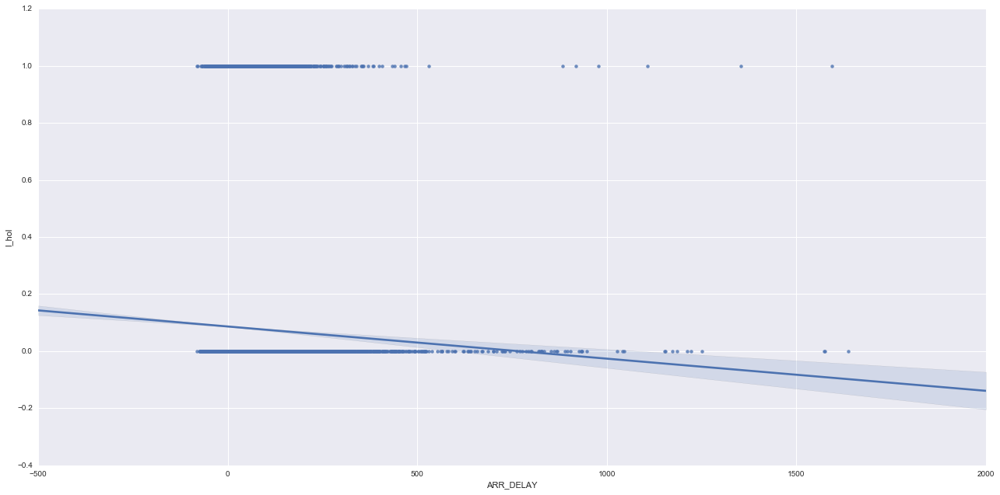

In [21]:
sns.lmplot("ARR_DELAY", "l_hol", df, size=9, aspect=2)

In [84]:
df = df[df['ARR_DELAY']>239]

# filter out those variable to be used
cols = ['month_coded', 'day_coded', 'UNIQUE_CARRIER', 'dt_g_code', 'DISTANCE', 'ORIGIN_Data_2014', 'fed_hol']

df_x = df[cols]
df_x.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 658 entries, 692 to 188032
Data columns (total 7 columns):
month_coded         658 non-null object
day_coded           658 non-null object
UNIQUE_CARRIER      658 non-null object
dt_g_code           658 non-null object
DISTANCE            658 non-null int64
ORIGIN_Data_2014    658 non-null int64
fed_hol             658 non-null int64
dtypes: int64(3), object(4)
memory usage: 41.1+ KB


In [85]:
## Normalise the distance and origin_data_2014
df_x['stand_dist'] = (df_x['DISTANCE'] - df_x['DISTANCE'].mean()) / df_x['DISTANCE'].std()
df_x['stand_volume'] = (df_x['ORIGIN_Data_2014'] - df_x['ORIGIN_Data_2014'].mean()) / df_x['ORIGIN_Data_2014'].std()
df_x.head(10)

/home/vagrant/.anaconda/lib/python2.7/site-packages/ipykernel/__main__.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy

/home/vagrant/.anaconda/lib/python2.7/site-packages/ipykernel/__main__.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy



,month_coded,day_coded,UNIQUE_CARRIER,dt_g_code,DISTANCE,ORIGIN_Data_2014,fed_hol,stand_dist,stand_volume
692,Winter,Other Weekdays,AA,Afternoon Departure,236,20551016,0,-1.473800,0.286893
858,Winter,Saturday,AA,Afternoon Departure,2342,19468523,0,1.001544,0.178407
988,Winter,Other Weekdays,AA,Evening and Night Departure,337,22756008,0,-1.355086,0.507875
1031,Winter,Sunday,AA,Afternoon Departure,236,20551016,0,-1.473800,0.286893
1325,Winter,Monday,AA,Afternoon Departure,337,22756008,1,-1.355086,0.507875
1410,Winter,Saturday,AA,Afternoon Departure,1592,6108758,0,0.120012,-1.160492
2377,Winter,Other Weekdays,AS,Afternoon Departure,2311,10057794,0,0.965108,-0.764724
3377,Winter,Monday,AA,Afternoon Departure,236,20551016,0,-1.473800,0.286893
3637,Winter,Other Weekdays,DL,Evening and Night Departure,1979,15775941,0,0.574883,-0.191659
3759,Winter,Saturday,DL,Afternoon Departure,1979,15775941,0,0.574883,-0.191659


In [86]:
df_x = df_x.drop(['DISTANCE','ORIGIN_Data_2014'], axis=1)
df_x.head(10)

,month_coded,day_coded,UNIQUE_CARRIER,dt_g_code,fed_hol,stand_dist,stand_volume
692,Winter,Other Weekdays,AA,Afternoon Departure,0,-1.473800,0.286893
858,Winter,Saturday,AA,Afternoon Departure,0,1.001544,0.178407
988,Winter,Other Weekdays,AA,Evening and Night Departure,0,-1.355086,0.507875
1031,Winter,Sunday,AA,Afternoon Departure,0,-1.473800,0.286893
1325,Winter,Monday,AA,Afternoon Departure,1,-1.355086,0.507875
1410,Winter,Saturday,AA,Afternoon Departure,0,0.120012,-1.160492
2377,Winter,Other Weekdays,AS,Afternoon Departure,0,0.965108,-0.764724
3377,Winter,Monday,AA,Afternoon Departure,0,-1.473800,0.286893
3637,Winter,Other Weekdays,DL,Evening and Night Departure,0,0.574883,-0.191659
3759,Winter,Saturday,DL,Afternoon Departure,0,0.574883,-0.191659


In [87]:
# Create Dummy variable
df_month = pd.get_dummies(df_x['month_coded'])
df_day = pd.get_dummies(df_x['day_coded'])
df_time = pd.get_dummies(df_x['dt_g_code'])
df_carrier = pd.get_dummies(df_x['UNIQUE_CARRIER'])

df_x = pd.concat([df_x, df_month, df_day, df_time, df_carrier], axis=1)
df_x = df_x.drop(['month_coded','day_coded','UNIQUE_CARRIER','dt_g_code'], axis=1)
df_x.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 658 entries, 692 to 188032
Data columns (total 26 columns):
fed_hol                        658 non-null int64
stand_dist                     658 non-null float64
stand_volume                   658 non-null float64
Autumn                         658 non-null float64
Spring                         658 non-null float64
Summer                         658 non-null float64
Winter                         658 non-null float64
Monday                         658 non-null float64
Other Weekdays                 658 non-null float64
Saturday                       658 non-null float64
Sunday                         658 non-null float64
Afternoon Departure            658 non-null float64
Evening and Night Departure    658 non-null float64
Morning Departure              658 non-null float64
AA                             658 non-null float64
AS                             658 non-null float64
B6                             658 non-null float64
DL      

In [88]:
# Drop the binary set of variables with the lowest % for delay
df_x = df_x.drop(['Autumn','Saturday','Morning Departure'], axis=1)
df_x.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 658 entries, 692 to 188032
Data columns (total 23 columns):
fed_hol                        658 non-null int64
stand_dist                     658 non-null float64
stand_volume                   658 non-null float64
Spring                         658 non-null float64
Summer                         658 non-null float64
Winter                         658 non-null float64
Monday                         658 non-null float64
Other Weekdays                 658 non-null float64
Sunday                         658 non-null float64
Afternoon Departure            658 non-null float64
Evening and Night Departure    658 non-null float64
AA                             658 non-null float64
AS                             658 non-null float64
B6                             658 non-null float64
DL                             658 non-null float64
F9                             658 non-null float64
HA                             658 non-null float64
NK      

In [95]:
y = df[df['ARR_DELAY'] > 239]
y = y['ARR_DELAY']
y.head(10)

692      591
858      245
988      565
1031    1593
1325     398
1410     242
2377     356
3377    1042
3637     288
3759     320
Name: ARR_DELAY, dtype: int64

In [96]:
y = (y - y.mean()) / y.std()

In [97]:
from sklearn.linear_model import LinearRegression

est_y = LinearRegression()

est_y.fit(df_x,y)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=1, normalize=False)

In [98]:
est_y.score(df_x,y)

0.26835690663469236

In [99]:
from sklearn import feature_selection as fs

def f_regression_feature_selection(input, response):    
# use this against your feature matrix to determine p-values for
# each feature (we care about the second array it returns).
    return fs.univariate_selection.f_regression(input, response)    

# How many features don't meet the F test threshold?
sum(f_regression_feature_selection(df_x,y)[0] < 10)
#[0] assume as F value

21

In [100]:
# Which column are we talking about?
select = f_regression_feature_selection(df_x,y)[0] < 10
df_x.columns[select]

Index([u'fed_hol', u'stand_dist', u'stand_volume', u'Spring', u'Summer',
       u'Winter', u'Monday', u'Other Weekdays', u'Sunday',
       u'Afternoon Departure', u'AS', u'B6', u'DL', u'F9', u'HA', u'NK', u'OO',
       u'UA', u'US', u'VX', u'WN'],
      dtype='object')

In [101]:
# difference between the ones available and the ones we wish to drop
post_select = df_x.columns.difference(df_x.columns[select])
# different --> drop

Xs = df_x[post_select]
Xs.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 658 entries, 692 to 188032
Data columns (total 2 columns):
AA                             658 non-null float64
Evening and Night Departure    658 non-null float64
dtypes: float64(2)
memory usage: 15.4 KB


In [102]:
# How many features don't meet the F test threshold?
sum(f_regression_feature_selection(Xs,y)[1] < 0.01)

2

In [104]:
# Sort the features based on their statistical significance 
ps = f_regression_feature_selection(Xs,y)[1]

p_score = zip(Xs.columns, ps)
ranked_p = sorted(p_score, key=lambda x:x[1])
# use a variable called x - start from first1 
ranked_p

[('AA', 2.5013480061106394e-12),
 ('Evening and Night Departure', 1.5062330927366917e-06)]

In [105]:
from sklearn.linear_model import Ridge
# Let's first build univariate models to see how well each individual features performs
scores = []
for feat, score in ranked_p:
    est = Ridge()
    X = [[x] for x in Xs[feat]]
    est.fit(X,y)
    scores.append(est.score(X,y))

In [106]:
# Now let's build models which cummatively look well combinations of features performs
scores = []
feats = []
for feat, score in ranked_p:
    est = Ridge()
    feats.append(feat) # append each featue 1 by 1
    if len(feats) == 1:
        X = [[x] for x in Xs[feat]] # if only 1 x - needa tranform it as dataframe
    else:
        X = Xs[feats] # act Xs - putting into feature - and Xs as original dataset - feature here add 1 more at a time - and putit back to the selected dataset
    est.fit(X, y)
    scores.append(est.score(X,y))

In [107]:
# Now let's build models which cummatively look well combinations of features performs
from sklearn.cross_validation import cross_val_score

scores_cv = []
feats = []
for feat, score in ranked_p:
    est = Ridge()
    feats.append(feat)
    if len(feats) == 1:
        X = [[x] for x in Xs[feat]]
    else:
        X = Xs[feats]
    est.fit(X, y)
    scores_cv.append(cross_val_score(est,X,y).mean())

In [108]:
df_cv = pd.DataFrame(scores,index=feats, columns=['regular'])
df_cv.iplot()

In [109]:
df_cv = pd.DataFrame(scores,index=feats, columns=['regular'])
df_cv['cv'] = scores_cv # 1 more line

df_cv.iplot()

In [111]:
from sklearn.feature_selection import RFE

# Create the RFE object and rank each features
est = Ridge()
rfe = RFE(estimator=est, n_features_to_select=1, step=1)

rfe.fit(df_x, y)
ranking = rfe.ranking_

scores = zip(df_x.columns, ranking) # only list them out not in ranking order
scores = sorted(scores, key=lambda x:x[1])
scores
#scores - name + ranking

[('Evening and Night Departure', 1),
 ('Afternoon Departure', 2),
 ('AA', 3),
 ('DL', 4),
 ('NK', 5),
 ('US', 6),
 ('WN', 7),
 ('F9', 8),
 ('HA', 9),
 ('stand_volume', 10),
 ('Monday', 11),
 ('OO', 12),
 ('Summer', 13),
 ('Spring', 14),
 ('B6', 15),
 ('stand_dist', 16),
 ('Sunday', 17),
 ('Other Weekdays', 18),
 ('AS', 19),
 ('VX', 20),
 ('UA', 21),
 ('Winter', 22),
 ('fed_hol', 23)]

In [112]:
p_features = [x[0] for x in ranked_p][:5]
p_features

rfe_features = [x[0] for x in scores] [:5]
print 'P Value:', p_features
print 'RFE Value:', rfe_features

P Value: ['AA', 'Evening and Night Departure']
RFE Value: ['Evening and Night Departure', 'Afternoon Departure', 'AA', 'DL', 'NK']


In [114]:
for feats in [p_features]:
    est = Ridge()
    X = Xs[feats]
    print cross_val_score(est, X, y).mean()

0.0615248821507


In [116]:
for feats in [rfe_features]:
    est = Ridge()
    X = df_x[feats]
    print cross_val_score(est, X, y).mean()

0.194362715345
